##  Problem Statement: 
###        To reduce customer churn (Switching from one operator to another operator), telecom companies need to predict which customers are at high risk of churn.

### Usage-based churn:   
#### Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time. In the Indian and the Southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

### Business obejective :
####   The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. The months are encoded as 6, 7, 8 and 9, respectively. 
 

In [1]:
##  Importing some important libraries :

##  for analysis:
import pandas as pd
import numpy as np

##  for visualization:
import matplotlib.pyplot as plt
import seaborn as sns

##  for no getting warnings
import warnings
warnings.filterwarnings(action = "ignore")

## some another libraries:
import os

import os
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_rows', 400)

####  Reading and Understanding Data  :

In [2]:
df =  pd.read_csv(r"C:\Users\HP\Downloads\telecom_churn_data.csv")
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
df.shape

(99999, 226)

In [4]:
# Create a copy of original data
churn_data = df.copy()

In [5]:
##  all the columns of df as a list:
all_columns =  df.columns.tolist()

####  High Value Customer : We need to predict churn only for the high-value customers. 
##### Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

 

In [6]:
rech_col = []

for i in all_columns:
    if 'rech' in i:
        rech_col.append(i)
print(rech_col)        

['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_num_9', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_amt_9', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_amt_9', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9']


In [7]:
# Though we have total amount of recharge for talktime we dont have that number for data, instead we have average and number of rechanrges
# so let's calculate that amount
churn_data['total_data_rech_amt_6'] = churn_data['av_rech_amt_data_6'] * churn_data['total_rech_data_6']
churn_data['total_data_rech_amt_7'] = churn_data['av_rech_amt_data_7'] * churn_data['total_rech_data_7']
churn_data['total_data_rech_amt_8'] = churn_data['av_rech_amt_data_8'] * churn_data['total_rech_data_8']
churn_data['total_data_rech_amt_9'] = churn_data['av_rech_amt_data_9'] * churn_data['total_rech_data_9']


In [8]:
churn_data.shape

(99999, 230)

In [9]:
# Drop the columns already accounted for 
churn_data.drop(['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'av_rech_amt_data_6',
              'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9'], axis=1, inplace=True)

In [10]:
churn_data.shape

(99999, 222)

In [11]:
##  good phase:  In this phase, the customer is happy with the service and behaves as usual.

In [12]:
# Find Average recharge amount for good phase i.e 6th and 7th month
good_phase_average_rech_amt = ( churn_data['total_rech_amt_6'].fillna(0) + churn_data['total_rech_amt_7'].fillna(0) + 
                               churn_data['total_data_rech_amt_6'].fillna(0) + churn_data['total_data_rech_amt_7'].fillna(0) ) / 2

print(good_phase_average_rech_amt)

0         559.0
1         306.0
2         241.5
3         270.0
4         301.0
          ...  
99994      85.0
99995     110.0
99996      98.5
99997    1602.0
99998     432.0
Length: 99999, dtype: float64


In [13]:
# 70 percentile of the good_phase_average_rech_amt data
gd_phase_avg_rech_amt_70 = np.percentile(good_phase_average_rech_amt, 70.0)
print(f'70 Percentile of recharge amount is : {gd_phase_avg_rech_amt_70}')

70 Percentile of recharge amount is : 478.0


In [14]:
# Keep high value customer data
churn_data = churn_data[good_phase_average_rech_amt >= gd_phase_avg_rech_amt_70]

In [15]:
print(f'Shape of high value customer data: {churn_data.shape}')

Shape of high value customer data: (30001, 222)


In [16]:
# Seperating columns for the 9th month
mnth9_columns = [col for col in all_columns if '9' in col]

# Seperating the ic columns 
mnth9_ic_columns = [col for col in mnth9_columns if 'ic' in col and 'mou' in col]

# Seperating oc columns
mnth9_oc_columns = [col for col in mnth9_columns if 'oc' in col and 'mou' in col]

# Seperating vol columns
mnth9_vol_columns = [col for col in mnth9_columns if 'vol' in col and 'mb' in col]

In [17]:
# Sum of all the ic columns
churn_data['ic_sum'] = churn_data[mnth9_ic_columns].sum(axis = 1)

# Sum of all the oc columns
churn_data['oc_sum'] = churn_data[mnth9_oc_columns].sum(axis = 1)

# Sum of all the vol columns
churn_data['vol_sum'] = churn_data[mnth9_vol_columns].sum(axis = 1)

In [18]:
churn_tag_columns = ['vol_sum', 'oc_sum', 'ic_sum']

# Create churn as the sum of newly aggregrated columns, as that will be 0 if all of the columns have 0 values
churn_data['churn'] = churn_data[churn_tag_columns].sum(axis = 1)

churn_data.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,ic_sum,oc_sum,vol_sum,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,4,3,2,6,362,252,252,0,252,252,252

In [19]:
churn_data.shape

(30001, 226)

In [20]:
# If the churn value is greater than 0 that means the user used a service indicating an active user
churn_data['churn'] = churn_data['churn'].apply(lambda x: 0 if x > 0 else 1)
churn_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,ic_sum,oc_sum,vol_sum,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,4,3,2,6,362,252,252,0,252,252,252

In [21]:
churn_data.churn.value_counts(normalize=True)

0    0.942369
1    0.057631
Name: churn, dtype: float64

In [22]:
# Dropping Month 9 Columns

churn_data.drop( [ col for col in mnth9_columns + churn_tag_columns if col not in ['total_rech_data_9', 'av_rech_amt_data_9'] ],
                axis=1, inplace=True)
churn_data.shape

(30001, 171)

In [23]:
churn_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,4.13,NaN,NaN,1.15,NaN,NaN,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,0.00,0.00,5.44,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,6/21/2014,7/16/2014,8/8/2014,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,NaN,1
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,15

###  Data Cleaning and EDA: 

#### MIssing Value_treatment:

In [24]:
##  checking for missing values: 
missing_psg = churn_data.isnull().mean().reset_index()
missing_psg[0] = missing_psg[0]*100
missing_psg = missing_psg.rename(columns = {"index" : "Features" , 0: "% of missing value"})
missing_psg = missing_psg.sort_values(by = "% of missing value" , ascending = False)
missing_psg

,Features,% of missing value
169,total_data_rech_amt_9,49.268358
139,arpu_3g_8,46.825106
168,total_data_rech_amt_8,46.825106
160,fb_user_8,46.825106
124,max_rech_data_8,46.825106
127,count_rech_2g_8,46.825106
130,count_rech_3g_8,46.825106
145,night_pck_user_8,46.825106
121,date_of_last_rech_data_8,46.825106
142,arpu_2g_8,46.825106


#####  Filtering those columns which have % of missing values above 40.



In [25]:
cols = missing_psg[missing_psg["% of missing value"] > 40]["Features"].tolist()
print(cols)
print(len(cols))

['total_data_rech_amt_9', 'arpu_3g_8', 'total_data_rech_amt_8', 'fb_user_8', 'max_rech_data_8', 'count_rech_2g_8', 'count_rech_3g_8', 'night_pck_user_8', 'date_of_last_rech_data_8', 'arpu_2g_8', 'arpu_3g_6', 'max_rech_data_6', 'total_data_rech_amt_6', 'night_pck_user_6', 'fb_user_6', 'count_rech_3g_6', 'date_of_last_rech_data_6', 'count_rech_2g_6', 'arpu_2g_6', 'date_of_last_rech_data_7', 'total_data_rech_amt_7', 'max_rech_data_7', 'arpu_3g_7', 'count_rech_2g_7', 'arpu_2g_7', 'count_rech_3g_7', 'night_pck_user_7', 'fb_user_7']
28


In [26]:
##  dropping all the variables which have % of missing value above 40
churn_data.drop(cols,  axis = 1, inplace = True)

In [27]:
churn_data.shape

(30001, 143)

In [28]:
##  Rechecking missing values: 

##  checking for missing values: 
missing_psg = churn_data.isnull().mean().reset_index()
missing_psg[0] = missing_psg[0]*100
missing_psg = missing_psg.rename(columns = {"index" : "Features" , 0: "% of missing value"})
missing_psg = missing_psg.sort_values(by = "% of missing value" , ascending = False)
missing_psg

,Features,% of missing value
76,loc_ic_mou_8,3.913203
61,og_others_8,3.913203
31,loc_og_t2f_mou_8,3.913203
67,loc_ic_t2t_mou_8,3.913203
58,spl_og_mou_8,3.913203
28,loc_og_t2m_mou_8,3.913203
70,loc_ic_t2m_mou_8,3.913203
73,loc_ic_t2f_mou_8,3.913203
25,loc_og_t2t_mou_8,3.913203
46,std_og_t2f_mou_8,3.913203


In [29]:
#Since rest of columns have even less than 5% of the data missing we can drop the rows with the missing values
# Drop rows with missing values

churn_data =  churn_data.dropna(axis = 0)
churn_data.shape

(28163, 143)

In [30]:
##  Rechecking missing values: 

##  checking for missing values: 
missing_psg = churn_data.isnull().mean().reset_index()
missing_psg[0] = missing_psg[0]*100
missing_psg = missing_psg.rename(columns = {"index" : "Features" , 0: "% of missing value"})
missing_psg = missing_psg.sort_values(by = "% of missing value" , ascending = False)
missing_psg

,Features,% of missing value
0,mobile_number,0.0
98,isd_ic_mou_6,0.0
92,total_ic_mou_6,0.0
93,total_ic_mou_7,0.0
94,total_ic_mou_8,0.0
95,spl_ic_mou_6,0.0
96,spl_ic_mou_7,0.0
97,spl_ic_mou_8,0.0
99,isd_ic_mou_7,0.0
90,std_ic_mou_7,0.0


In [31]:
# The date columns don't add any value excpet for marking the last day of the period so we will drop them


date_col = []

for i in churn_data.columns:
    if 'date' in i:
        date_col.append(i)
print(date_col)

['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']


In [32]:
#hence drop date col        
churn_data.drop(date_col, axis=1, inplace=True)

In [33]:
churn_data.shape

(28163, 137)

In [34]:
#  By looking at the dataframe we can see a few of the columns, like circle_id have only value. 
#  These kind of feature suggest no variance and hence wont be contributing anything to our target variable.
#  Check columns for only 1 unique value...drop single value col

nunique_df =  churn_data.nunique().reset_index() 
single_valued_cols =  nunique_df[nunique_df[0] == 1]["index"].tolist()

print(single_valued_cols)

['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']


In [35]:
#hence drop single value col    

churn_data.drop(single_valued_cols, axis=1, inplace=True)

In [36]:
churn_data.shape

(28163, 127)

In [37]:
churn_data.drop( "mobile_number", axis = 1, inplace = True)

In [38]:
churn_data.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.00,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.00,356.00,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0.0,0
21,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,0.00,763.29,934.69,938.79,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,860.34,1028.79,1068.54,2.48,10.19,19.54,118.23,74.63,129.16,4.61,2.84,10.39,125.33,87.68,159.11,14.06,5.98,0.18,67.69,38.23,101.74,0.00,0.00,0.00,81.76,44.21,101.93,207.09,131.89,261.04,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,22,26,27,600,680,718,50,50,50,30,20,50,0.00,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,720,0.00,0.00,0.00,0.0,0
23,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,17.71,131.91,133.68,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,0.00,2.36,6.35,39.61,0.0,0.01,0.

In [39]:
##  Let us check the correlation between the features and if we find any feature with high correlation. 
##  we can drop them features. 

corr = churn_data.corr()
corr.loc[:, :] = np.tril(corr, -1)
corr = corr.stack()
high_corr_value = corr[(corr > 0.60) | (corr < -0.60)]
high_corr_value


arpu_7              arpu_6              0.728704
arpu_8              arpu_6              0.671437
                    arpu_7              0.778413
onnet_mou_7         onnet_mou_6         0.770224
onnet_mou_8         onnet_mou_6         0.646114
                    onnet_mou_7         0.811314
offnet_mou_7        offnet_mou_6        0.755880
offnet_mou_8        offnet_mou_6        0.605742
                    offnet_mou_7        0.772001
roam_ic_mou_8       roam_ic_mou_7       0.618233
roam_og_mou_6       roam_ic_mou_6       0.647696
roam_og_mou_8       roam_og_mou_7       0.605246
loc_og_t2t_mou_7    loc_og_t2t_mou_6    0.801091
loc_og_t2t_mou_8    loc_og_t2t_mou_6    0.708473
                    loc_og_t2t_mou_7    0.836495
loc_og_t2m_mou_7    loc_og_t2m_mou_6    0.790918
loc_og_t2m_mou_8    loc_og_t2m_mou_6    0.698190
                    loc_og_t2m_mou_7    0.826281
loc_og_t2f_mou_7    loc_og_t2f_mou_6    0.812776
loc_og_t2f_mou_8    loc_og_t2f_mou_6    0.674290
                    

In [40]:
# List of columns that are explained well by other columns
drop_col_corr = ['loc_og_t2m_mou_6', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 
                 'std_og_t2m_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 
                 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 
                 'std_ic_t2m_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 
                 'total_rech_amt_8', 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8',
                 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
                 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8']

len(drop_col_corr)

40

In [41]:
# Drop the high corr columns
churn_data.drop(drop_col_corr, axis=1, inplace=True)
churn_data.shape

(28163, 87)

In [42]:
#Deriving new features

# Create a total mou instead of offnet and onnet

churn_data['total_mou_6'] = churn_data['onnet_mou_6'] + churn_data['offnet_mou_6']
churn_data['total_mou_7'] = churn_data['onnet_mou_7'] + churn_data['offnet_mou_7']
churn_data['total_mou_8'] = churn_data['onnet_mou_8'] + churn_data['offnet_mou_8']

# Drop the redundant columns
churn_data.drop(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8'], axis=1, inplace=True)

churn_data.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn,total_mou_6,total_mou_7,total_mou_8
7,1069.180,1349.850,3171.480,16.23,33.49,31.64,23.74,12.59,38.06,0.0,0.0,0.00,422.16,533.91,255.79,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,427.88,355.23,188.04,36.89,11.83,30.39,52.19,34.24,22.21,180.54,173.08,193.94,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,1580,0,0,779,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1,511.27,621.84,378.20
8,378.721,492.223,137.362,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,81.43,23.83,15.79,0.00,0.58,0.10,0.00,0.00,0.00,22.43,4.66,0.75,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,90,154,30,50,0,10,0.00,356.00,0.03,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0.0,0,508.35,431.66,171.56
21,514.453,597.753,637.760,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,97.04,94.09,129.74,0.00,0.00,0.00,763.29,934.69,938.79,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,125.33,87.68,159.11,14.06,5.98,0.18,0.00,0.00,0.00,81.76,44.21,101.93,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,22,26,27,50,50,50,30,20,50,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,720,0.00,0.00,0.00,0.0,0,860.34,1028.79,1068.53
23,74.350,193.897,366.966,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,17.71,131.91,133.68,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.0,0.01,0.00,0.1,0.0,17.71,0.0,0.0,0.0,116.63,174.41,224.21,0.51,0.00,13.38,0.00,0.00,0.00,2.94,14.89,57.29,0.00,0.0,0.0,0.00,28.23,3.74,0.00,5.35,13.06,3,5,4,0,179,179,0,179,0,0.00,0.48,0.01,0,0,0,0,0,0,0,2,1,0,0,1,604,40.45,51.86,0.00,0.0,0,134.37,140.02,239.47
33,977.020,2362.833,409.230,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.56,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.56,0.0,0.0,0.0,3.48,0.88,40.54,0.00,2.91,0.05,0.23,0.96,0.13,3.18,5.66,1.04,0.00,0.0,0.0,0.00,0.00,0.00,1.23,0.65,0.20,7,14,1,252,1255,455,252,0,455,87.05,57.76,7.97,0,0,0,0,0,0,4,5,1,1,3,0,1328,358.10,2706.83,1714.67,0.0,0,0.00,0.00,0.00


In [43]:
churn_data.shape

(28163, 84)

#### Since rest of the columns are break out of totals into granualr details we will not merge them into one, 
#### instead we will create new features that will each account for the good pahse by averaging out the values for 6th and 7th month

In [44]:
# Seperate columns for 6th and 7th month
col_for_6_7 = [col[:-2] for col in churn_data.columns if '6' in col or '7' in col]
print(col_for_6_7)

['arpu', 'arpu', 'roam_ic_mou', 'roam_ic_mou', 'roam_og_mou', 'roam_og_mou', 'loc_og_t2c_mou', 'loc_og_t2c_mou', 'loc_og_mou', 'loc_og_mou', 'std_og_t2f_mou', 'std_og_t2f_mou', 'std_og_mou', 'std_og_mou', 'isd_og_mou', 'isd_og_mou', 'spl_og_mou', 'spl_og_mou', 'og_others', 'og_others', 'loc_ic_mou', 'loc_ic_mou', 'std_ic_t2t_mou', 'std_ic_t2t_mou', 'std_ic_t2f_mou', 'std_ic_t2f_mou', 'std_ic_mou', 'std_ic_mou', 'spl_ic_mou', 'spl_ic_mou', 'isd_ic_mou', 'isd_ic_mou', 'ic_others', 'ic_others', 'total_rech_num', 'total_rech_num', 'max_rech_amt', 'max_rech_amt', 'last_day_rch_amt', 'last_day_rch_amt', 'vol_2g_mb', 'vol_2g_mb', 'monthly_2g', 'monthly_2g', 'sachet_2g', 'sachet_2g', 'monthly_3g', 'monthly_3g', 'sachet_3g', 'sachet_3g', 'total_mou', 'total_mou']


In [45]:
# Create new feature and drop the redundant columns
for col in set(col_for_6_7):
    churn_data[f'gd_ph_{col}'] = ( churn_data[f'{col}_6'] + churn_data[f'{col}_7'] ) / 2
    churn_data.drop([f'{col}_6', f'{col}_7'], axis=1, inplace=True)
        
churn_data.head()

,arpu_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn,total_mou_8,gd_ph_std_ic_mou,gd_ph_spl_og_mou,gd_ph_loc_og_t2c_mou,gd_ph_og_others,gd_ph_monthly_2g,gd_ph_spl_ic_mou,gd_ph_std_ic_t2f_mou,gd_ph_max_rech_amt,gd_ph_monthly_3g,gd_ph_total_rech_num,gd_ph_loc_og_mou,gd_ph_last_day_rch_amt,gd_ph_arpu,gd_ph_ic_others,gd_ph_vol_2g_mb,gd_ph_std_ic_t2t_mou,gd_ph_sachet_2g,gd_ph_std_og_t2f_mou,gd_ph_roam_ic_mou,gd_ph_total_mou,gd_ph_loc_ic_mou,gd_ph_sachet_3g,gd_ph_std_og_mou,gd_ph_isd_og_mou,gd_ph_isd_ic_mou,gd_ph_roam_og_mou
7,3171.480,31.64,38.06,0.00,255.79,16.68,77.84,10.01,6.50,0.0,188.04,30.39,22.21,193.94,0.0,31.59,15.14,7,1580,779,0.00,0,0,0,0,802,57.74,19.38,18.74,0.0,1,378.20,176.810,2.25,0.0,0.0,0.0,0.105,43.215,1185.0,0.0,5.0,478.035,0.0,1209.5150,15.465,0.000,24.360,0.0,13.37,24.86,566.555,391.555,0.0,68.000,0.090,8.295,18.165
8,137.362,0.00,0.00,7.15,63.04,0.00,98.28,0.00,10.23,0.0,15.79,0.10,0.00,0.75,0.0,0.00,0.00,14,30,10,0.03,0,3,0,0,315,21.03,910.65,122.16,0.0,0,171.56,13.545,0.00,0.0,0.0,0.5,0.000,0.000,122.0,0.0,20.0,333.135,25.0,435.4720,0.000,178.000,0.290,0.5,0.00,0.00,470.005,52.630,0.0,136.870,0.000,0.000,0.000
21,637.760,0.00,0.00,0.00,129.74,0.00,938.79,0.00,0.00,0.0,159.11,0.18,0.00,101.93,0.0,0.00,0.00,27,50,50,0.00,0,0,0,0,720,0.00,0.00,0.00,0.0,0,1068.53,62.985,0.00,0.0,0.0,0.0,0.000,0.000,50.0,0.0,24.0,95.565,25.0,556.1030,0.000,0.000,10.020,0.0,0.00,0.00,944.565,106.505,0.0,848.990,0.000,0.000,0.000
23,366.966,0.00,0.00,17.71,182.14,0.00,39.61,0.00,17.71,0.0,224.21,13.38,0.00,57.29,0.0,3.74,13.06,4,179,0,0.01,0,0,1,1,604,40.45,51.86,0.00,0.0,0,239.47,8.915,0.05,0.0,0.0,0.0,0.000,0.000,89.5,1.0,4.0,132.795,89.5,134.1235,2.675,0.240,0.255,0.0,0.00,0.00,137.195,145.520,0.0,4.355,0.005,14.115,0.000
33,409.230,0.00,0.00,0.56,0.00,0.00,0.00,0.00,0.56,0.0,40.54,0.05,0.13,1.04,0.0,0.00,0.20,1,455,455,7.97,0,0,1,0,1328,358.10,2706.83,1714.67,0.0,0,0.00,4.420,0.00,0.0,0.0,0.0,0.000,0.595,753.5,4.5,10.5,0.000,126.0,1669.9265,0.940,72.405,1.455,0.0,0.00,0.00,0.000,2.180,2.0,0.000,0.000,0.000,0.000


In [46]:
churn_data.shape

(28163, 58)

In [47]:
# vbc columns doesn't have number of month as suffix so it seemed to have missed out. 
# let's avergae out the columns for this feature too.

# Create new column
churn_data['gd_ph_vbc_3g'] = ( churn_data['jul_vbc_3g'] + churn_data['jun_vbc_3g'] ) / 2

# Drop redundant column
churn_data.drop(['jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'], axis=1, inplace=True)


In [48]:
# Rename the august column for vbc to vbc_3g_8
churn_data['vbc_3g_8'] = churn_data['aug_vbc_3g']
churn_data.drop('aug_vbc_3g', axis=1, inplace=True)

churn_data.head()

,arpu_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,churn,total_mou_8,gd_ph_std_ic_mou,gd_ph_spl_og_mou,gd_ph_loc_og_t2c_mou,gd_ph_og_others,gd_ph_monthly_2g,gd_ph_spl_ic_mou,gd_ph_std_ic_t2f_mou,gd_ph_max_rech_amt,gd_ph_monthly_3g,gd_ph_total_rech_num,gd_ph_loc_og_mou,gd_ph_last_day_rch_amt,gd_ph_arpu,gd_ph_ic_others,gd_ph_vol_2g_mb,gd_ph_std_ic_t2t_mou,gd_ph_sachet_2g,gd_ph_std_og_t2f_mou,gd_ph_roam_ic_mou,gd_ph_total_mou,gd_ph_loc_ic_mou,gd_ph_sachet_3g,gd_ph_std_og_mou,gd_ph_isd_og_mou,gd_ph_isd_ic_mou,gd_ph_roam_og_mou,gd_ph_vbc_3g,vbc_3g_8
7,3171.480,31.64,38.06,0.00,255.79,16.68,77.84,10.01,6.50,0.0,188.04,30.39,22.21,193.94,0.0,31.59,15.14,7,1580,779,0.00,0,0,0,0,802,1,378.20,176.810,2.25,0.0,0.0,0.0,0.105,43.215,1185.0,0.0,5.0,478.035,0.0,1209.5150,15.465,0.000,24.360,0.0,13.37,24.86,566.555,391.555,0.0,68.000,0.090,8.295,18.165,19.060,57.74
8,137.362,0.00,0.00,7.15,63.04,0.00,98.28,0.00,10.23,0.0,15.79,0.10,0.00,0.75,0.0,0.00,0.00,14,30,10,0.03,0,3,0,0,315,0,171.56,13.545,0.00,0.0,0.0,0.5,0.000,0.000,122.0,0.0,20.0,333.135,25.0,435.4720,0.000,178.000,0.290,0.5,0.00,0.00,470.005,52.630,0.0,136.870,0.000,0.000,0.000,516.405,21.03
21,637.760,0.00,0.00,0.00,129.74,0.00,938.79,0.00,0.00,0.0,159.11,0.18,0.00,101.93,0.0,0.00,0.00,27,50,50,0.00,0,0,0,0,720,0,1068.53,62.985,0.00,0.0,0.0,0.0,0.000,0.000,50.0,0.0,24.0,95.565,25.0,556.1030,0.000,0.000,10.020,0.0,0.00,0.00,944.565,106.505,0.0,848.990,0.000,0.000,0.000,0.000,0.00
23,366.966,0.00,0.00,17.71,182.14,0.00,39.61,0.00,17.71,0.0,224.21,13.38,0.00,57.29,0.0,3.74,13.06,4,179,0,0.01,0,0,1,1,604,0,239.47,8.915,0.05,0.0,0.0,0.0,0.000,0.000,89.5,1.0,4.0,132.795,89.5,134.1235,2.675,0.240,0.255,0.0,0.00,0.00,137.195,145.520,0.0,4.355,0.005,14.115,0.000,25.930,40.45
33,409.230,0.00,0.00,0.56,0.00,0.00,0.00,0.00,0.56,0.0,40.54,0.05,0.13,1.04,0.0,0.00,0.20,1,455,455,7.97,0,0,1,0,1328,0,0.00,4.420,0.00,0.0,0.0,0.0,0.000,0.595,753.5,4.5,10.5,0.000,126.0,1669.9265,0.940,72.405,1.455,0.0,0.00,0.00,0.000,2.180,2.0,0.000,0.000,0.000,0.000,2210.750,358.10


In [49]:
churn_data.shape

(28163, 56)

In [50]:
# Reset the index 
churn_data.reset_index(inplace=True, drop=True)
churn_data.head()

,arpu_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,churn,total_mou_8,gd_ph_std_ic_mou,gd_ph_spl_og_mou,gd_ph_loc_og_t2c_mou,gd_ph_og_others,gd_ph_monthly_2g,gd_ph_spl_ic_mou,gd_ph_std_ic_t2f_mou,gd_ph_max_rech_amt,gd_ph_monthly_3g,gd_ph_total_rech_num,gd_ph_loc_og_mou,gd_ph_last_day_rch_amt,gd_ph_arpu,gd_ph_ic_others,gd_ph_vol_2g_mb,gd_ph_std_ic_t2t_mou,gd_ph_sachet_2g,gd_ph_std_og_t2f_mou,gd_ph_roam_ic_mou,gd_ph_total_mou,gd_ph_loc_ic_mou,gd_ph_sachet_3g,gd_ph_std_og_mou,gd_ph_isd_og_mou,gd_ph_isd_ic_mou,gd_ph_roam_og_mou,gd_ph_vbc_3g,vbc_3g_8
0,3171.480,31.64,38.06,0.00,255.79,16.68,77.84,10.01,6.50,0.0,188.04,30.39,22.21,193.94,0.0,31.59,15.14,7,1580,779,0.00,0,0,0,0,802,1,378.20,176.810,2.25,0.0,0.0,0.0,0.105,43.215,1185.0,0.0,5.0,478.035,0.0,1209.5150,15.465,0.000,24.360,0.0,13.37,24.86,566.555,391.555,0.0,68.000,0.090,8.295,18.165,19.060,57.74
1,137.362,0.00,0.00,7.15,63.04,0.00,98.28,0.00,10.23,0.0,15.79,0.10,0.00,0.75,0.0,0.00,0.00,14,30,10,0.03,0,3,0,0,315,0,171.56,13.545,0.00,0.0,0.0,0.5,0.000,0.000,122.0,0.0,20.0,333.135,25.0,435.4720,0.000,178.000,0.290,0.5,0.00,0.00,470.005,52.630,0.0,136.870,0.000,0.000,0.000,516.405,21.03
2,637.760,0.00,0.00,0.00,129.74,0.00,938.79,0.00,0.00,0.0,159.11,0.18,0.00,101.93,0.0,0.00,0.00,27,50,50,0.00,0,0,0,0,720,0,1068.53,62.985,0.00,0.0,0.0,0.0,0.000,0.000,50.0,0.0,24.0,95.565,25.0,556.1030,0.000,0.000,10.020,0.0,0.00,0.00,944.565,106.505,0.0,848.990,0.000,0.000,0.000,0.000,0.00
3,366.966,0.00,0.00,17.71,182.14,0.00,39.61,0.00,17.71,0.0,224.21,13.38,0.00,57.29,0.0,3.74,13.06,4,179,0,0.01,0,0,1,1,604,0,239.47,8.915,0.05,0.0,0.0,0.0,0.000,0.000,89.5,1.0,4.0,132.795,89.5,134.1235,2.675,0.240,0.255,0.0,0.00,0.00,137.195,145.520,0.0,4.355,0.005,14.115,0.000,25.930,40.45
4,409.230,0.00,0.00,0.56,0.00,0.00,0.00,0.00,0.56,0.0,40.54,0.05,0.13,1.04,0.0,0.00,0.20,1,455,455,7.97,0,0,1,0,1328,0,0.00,4.420,0.00,0.0,0.0,0.0,0.000,0.595,753.5,4.5,10.5,0.000,126.0,1669.9265,0.940,72.405,1.455,0.0,0.00,0.00,0.000,2.180,2.0,0.000,0.000,0.000,0.000,2210.750,358.10


In [51]:
churns_data = churn_data
churns_data.head()

,arpu_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,churn,total_mou_8,gd_ph_std_ic_mou,gd_ph_spl_og_mou,gd_ph_loc_og_t2c_mou,gd_ph_og_others,gd_ph_monthly_2g,gd_ph_spl_ic_mou,gd_ph_std_ic_t2f_mou,gd_ph_max_rech_amt,gd_ph_monthly_3g,gd_ph_total_rech_num,gd_ph_loc_og_mou,gd_ph_last_day_rch_amt,gd_ph_arpu,gd_ph_ic_others,gd_ph_vol_2g_mb,gd_ph_std_ic_t2t_mou,gd_ph_sachet_2g,gd_ph_std_og_t2f_mou,gd_ph_roam_ic_mou,gd_ph_total_mou,gd_ph_loc_ic_mou,gd_ph_sachet_3g,gd_ph_std_og_mou,gd_ph_isd_og_mou,gd_ph_isd_ic_mou,gd_ph_roam_og_mou,gd_ph_vbc_3g,vbc_3g_8
0,3171.480,31.64,38.06,0.00,255.79,16.68,77.84,10.01,6.50,0.0,188.04,30.39,22.21,193.94,0.0,31.59,15.14,7,1580,779,0.00,0,0,0,0,802,1,378.20,176.810,2.25,0.0,0.0,0.0,0.105,43.215,1185.0,0.0,5.0,478.035,0.0,1209.5150,15.465,0.000,24.360,0.0,13.37,24.86,566.555,391.555,0.0,68.000,0.090,8.295,18.165,19.060,57.74
1,137.362,0.00,0.00,7.15,63.04,0.00,98.28,0.00,10.23,0.0,15.79,0.10,0.00,0.75,0.0,0.00,0.00,14,30,10,0.03,0,3,0,0,315,0,171.56,13.545,0.00,0.0,0.0,0.5,0.000,0.000,122.0,0.0,20.0,333.135,25.0,435.4720,0.000,178.000,0.290,0.5,0.00,0.00,470.005,52.630,0.0,136.870,0.000,0.000,0.000,516.405,21.03
2,637.760,0.00,0.00,0.00,129.74,0.00,938.79,0.00,0.00,0.0,159.11,0.18,0.00,101.93,0.0,0.00,0.00,27,50,50,0.00,0,0,0,0,720,0,1068.53,62.985,0.00,0.0,0.0,0.0,0.000,0.000,50.0,0.0,24.0,95.565,25.0,556.1030,0.000,0.000,10.020,0.0,0.00,0.00,944.565,106.505,0.0,848.990,0.000,0.000,0.000,0.000,0.00
3,366.966,0.00,0.00,17.71,182.14,0.00,39.61,0.00,17.71,0.0,224.21,13.38,0.00,57.29,0.0,3.74,13.06,4,179,0,0.01,0,0,1,1,604,0,239.47,8.915,0.05,0.0,0.0,0.0,0.000,0.000,89.5,1.0,4.0,132.795,89.5,134.1235,2.675,0.240,0.255,0.0,0.00,0.00,137.195,145.520,0.0,4.355,0.005,14.115,0.000,25.930,40.45
4,409.230,0.00,0.00,0.56,0.00,0.00,0.00,0.00,0.56,0.0,40.54,0.05,0.13,1.04,0.0,0.00,0.20,1,455,455,7.97,0,0,1,0,1328,0,0.00,4.420,0.00,0.0,0.0,0.0,0.000,0.595,753.5,4.5,10.5,0.000,126.0,1669.9265,0.940,72.405,1.455,0.0,0.00,0.00,0.000,2.180,2.0,0.000,0.000,0.000,0.000,2210.750,358.10


In [52]:
churns_data.describe()

,arpu_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,churn,total_mou_8,gd_ph_std_ic_mou,gd_ph_spl_og_mou,gd_ph_loc_og_t2c_mou,gd_ph_og_others,gd_ph_monthly_2g,gd_ph_spl_ic_mou,gd_ph_std_ic_t2f_mou,gd_ph_max_rech_amt,gd_ph_monthly_3g,gd_ph_total_rech_num,gd_ph_loc_og_mou,gd_ph_last_day_rch_amt,gd_ph_arpu,gd_ph_ic_others,gd_ph_vol_2g_mb,gd_ph_std_ic_t2t_mou,gd_ph_sachet_2g,gd_ph_std_og_t2f_mou,gd_ph_roam_ic_mou,gd_ph_total_mou,gd_ph_loc_ic_mou,gd_ph_sachet_3g,gd_ph_std_og_mou,gd_ph_isd_og_mou,gd_ph_isd_ic_mou,gd_ph_roam_og_mou,gd_ph_vbc_3g,vbc_3g_8
count,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000
mean,528.992500,13.145865,20.926258,1.789363,247.845569,1.646062,322.121339,1.989213,6.889342,0.061151,235.639315,14.625113,2.692254,46.761176,0.027889,11.437856,1.291328,10.435323,164.597131,94.779640,109.831129,0.160210,1.100771,0.209459,0.208287,1233.456627,0.030821,597.378280,49.261396,6.610121,1.766261,0.359434,0.183397,0.041413,2.835280,167.748198,0.213773,12.026489,263.016895,98.522885,567.163074,1.371220,127.717157,15.535415,1.154618,1.840391,14.632102,656.094111,241.031533,0.217200,362.567597,2.047679,11.458002,23.757457,169.310408,173.745705
std,500.479643,76.125433,107.722393,7.390599,367.353912,11.126142,615.275135,45.888765,20.813297,3.421503,313.175366,73.017056,20.476161,142.430462,0.113430,72.276371,13.164084,9.288002,169.014286,141.789453,317.809110,0.413067,2.573361,0.619138,1.116503,962.975074,0.172834,706.447419,135.463961,17.610173,6.536779,2.533710,0.392058,0.154356,18.312495,148.011960,0.565446,8.650631,361.575126,108.064480,431.807280,14.081974,304.044111,76.790814,2.435548,11.647474,66.404361,657.870003,303.003271,0.940707,586.639498,45.536401,74.792010,94.459260,395.513994,424.621028
min,-345.129000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-451.713500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,258.075500,0.000000,0.000000,0.000000,31.410000,0.000000,0.000000,0.000000,0.000000,0.000000,51.185000,0.000000,0.000000,0.940000,0.000000,0.000000,0.000000,4.000000,67.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,472.000000,0.000000,117.170000,2.955000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,104.000000,0.000000,6.500000,45.762500,30.000000,355.689750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,178.822500,62.502500,0.000000,2.450000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,445.338000,0.000000,0.000000,0.000000,124.060000,0.000000,34.990000,0.000000,0.700000,0.000000,140.310000,0.330000,0.000000,10.810000,0.000000,0.000000,0.000000,8.000000,140.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,875.000

### Observation
##### We can see almost every columns has some outliers, while most of them are becuase there are 0.0 as the service was not used some are actual outliers
##### Since we don't have actuall bussines people to check the factfulness of the data, we will cap those features

In [53]:
churns_data.nunique()

arpu_8                    27308
roam_ic_mou_8              3401
roam_og_mou_8              3953
loc_og_t2c_mou_8           1709
loc_og_mou_8              17417
std_og_t2f_mou_8           1494
std_og_mou_8              14558
isd_og_mou_8                854
spl_og_mou_8               3179
og_others_8                 130
loc_ic_mou_8              17918
std_ic_t2t_mou_8           4241
std_ic_t2f_mou_8           1875
std_ic_mou_8               7643
spl_ic_mou_8                 80
isd_ic_mou_8               3303
ic_others_8                1244
total_rech_num_8             95
max_rech_amt_8              180
last_day_rch_amt_8          178
vol_2g_mb_8                9989
monthly_2g_8                  6
sachet_2g_8                  34
monthly_3g_8                 12
sachet_3g_8                  29
aon                        3284
churn                         2
total_mou_8               24494
gd_ph_std_ic_mou          14665
gd_ph_spl_og_mou           6537
gd_ph_loc_og_t2c_mou       3046
gd_ph_og

In [54]:
churns_data["churn"].value_counts()

0    27295
1      868
Name: churn, dtype: int64

<AxesSubplot:xlabel='churn', ylabel='count'>

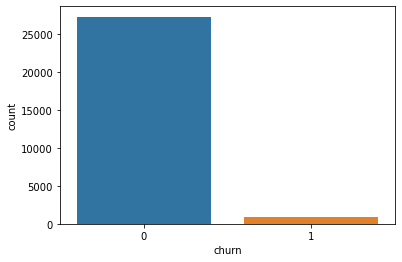

In [55]:
sns.countplot(churns_data["churn"])

In [56]:
col_analysis = ['arpu_8', 'loc_og_mou_8', 'max_rech_amt_8', 'last_day_rch_amt_8', 'aon', 'total_mou_8', 
               'gd_ph_loc_ic_mou', 'gd_ph_last_day_rch_amt', 'gd_ph_std_og_mou', 'gd_ph_max_rech_amt', 
              'gd_ph_loc_og_mou', 'gd_ph_arpu']

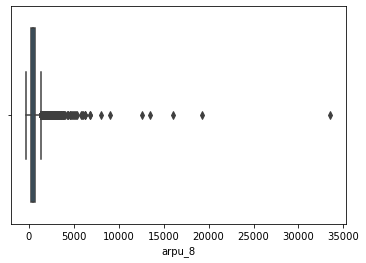

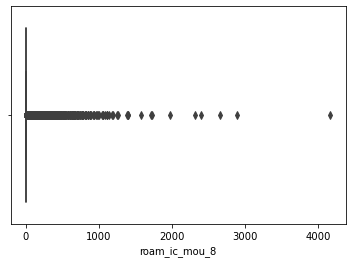

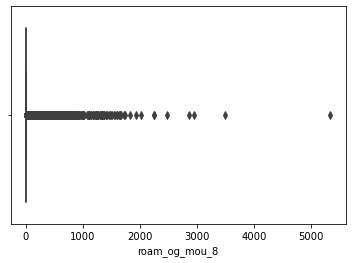

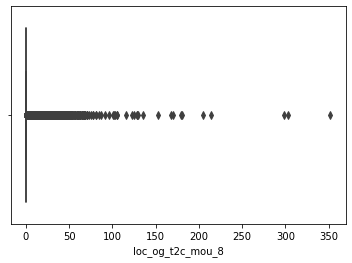

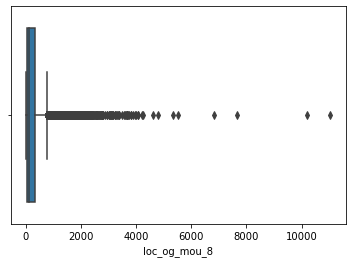

...

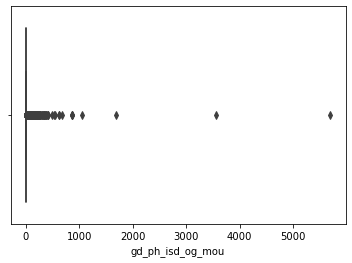

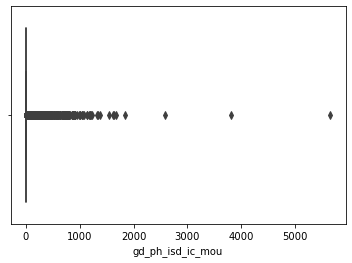

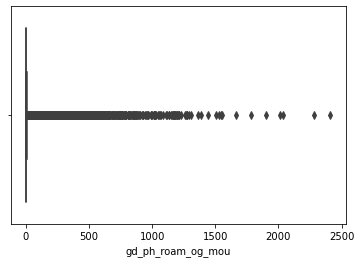

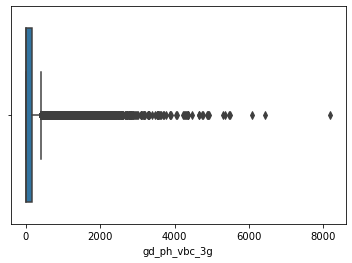

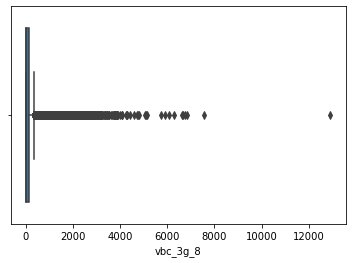

In [57]:
##  Churn Feature is categorical:

for i in churns_data.columns:
        sns.boxplot(churns_data[i])
        plt.show()

In [58]:
# ###  Outlier Treatment:

for var in col_analysis:
    q1 =  churns_data[var].describe()['25%']
    q2 =  churns_data[var].describe()['75%']
    iqr = q2-q1
    lower_bound = q1 - (1.5*iqr)
    upper_bound = q2 + (1.5*iqr)
    churns_data[var]  =  np.where(churns_data[var]>upper_bound, upper_bound, churns_data[var])  ## Capping
    churns_data[var]  =  np.where(churns_data[var]<lower_bound, lower_bound, churns_data[var])   ## flooring
    
## Rest of  the outliers of the features can be handled by rescaling method.    

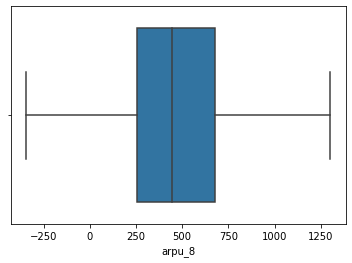

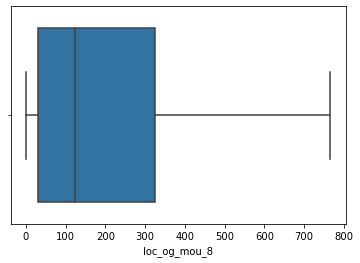

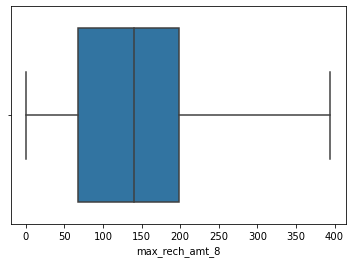

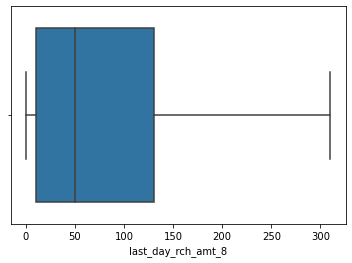

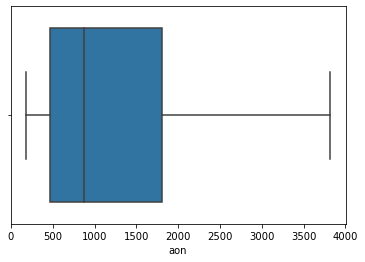

...

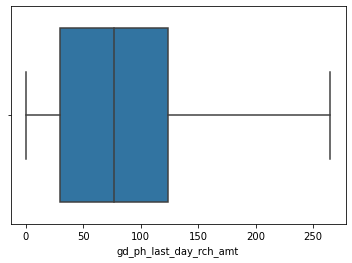

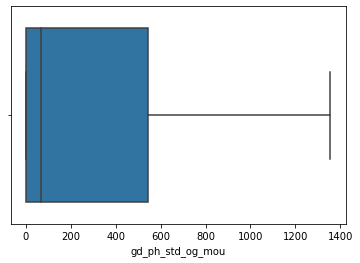

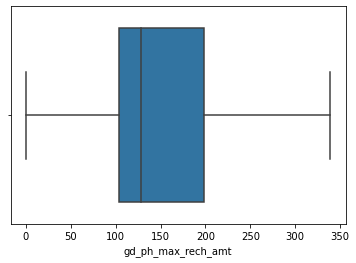

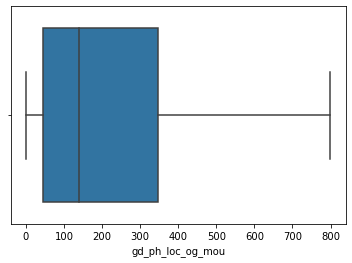

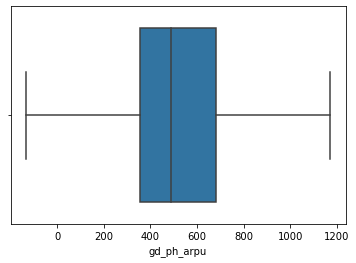

In [59]:
### Plotting boxplot for checking outliers: 
for i in col_analysis:
    sns.boxplot(churns_data[i])
    plt.show() 
        
### Outlier treatment is done.        

##  Univariate Analysis:

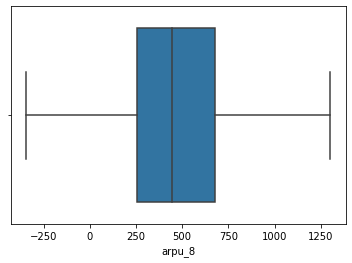

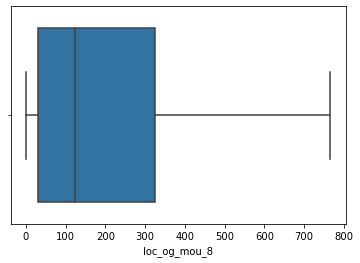

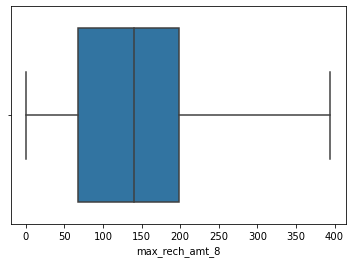

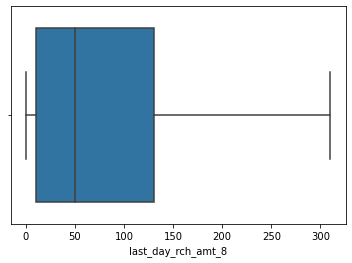

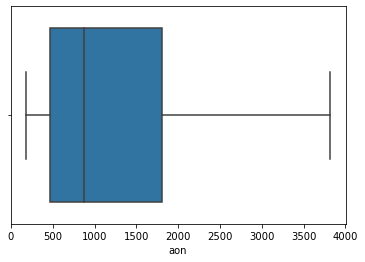

...

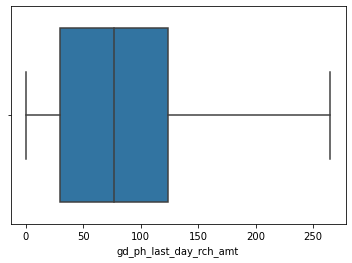

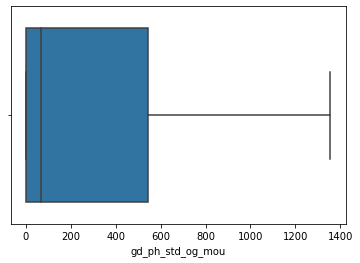

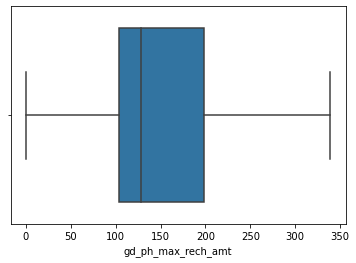

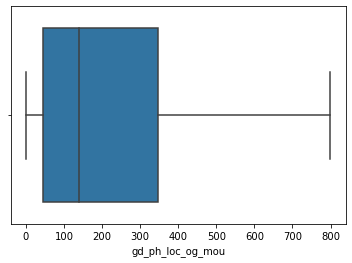

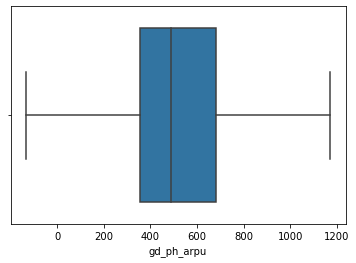

In [60]:
# Going through the output of describe we can filter out the features that needs a second look

# List of features to be analyzed
col_analysis = ['arpu_8', 'loc_og_mou_8', 'max_rech_amt_8', 'last_day_rch_amt_8', 'aon', 'total_mou_8', 
               'gd_ph_loc_ic_mou', 'gd_ph_last_day_rch_amt', 'gd_ph_std_og_mou', 'gd_ph_max_rech_amt', 
              'gd_ph_loc_og_mou', 'gd_ph_arpu']

### Plotting boxplot: 
for i in col_analysis:
    sns.boxplot(churns_data[i])
    plt.show() 

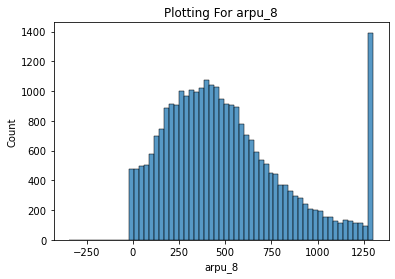

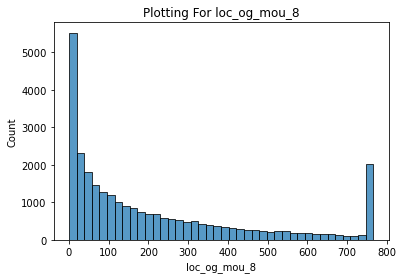

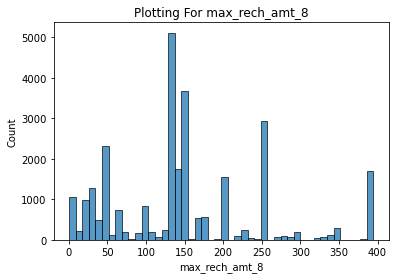

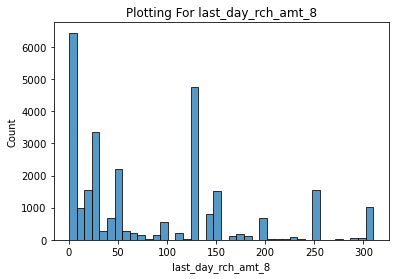

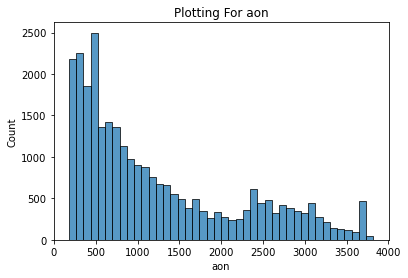

...

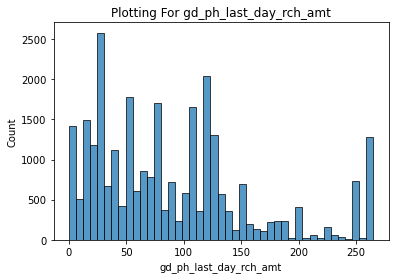

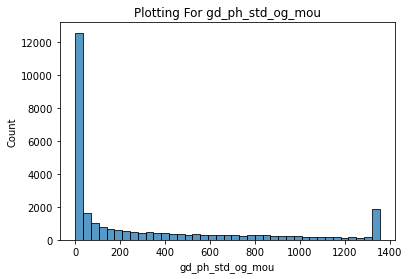

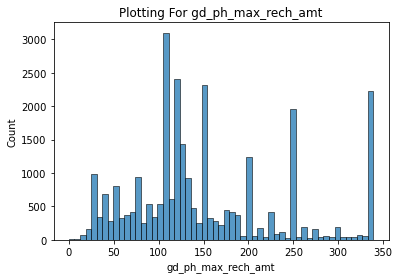

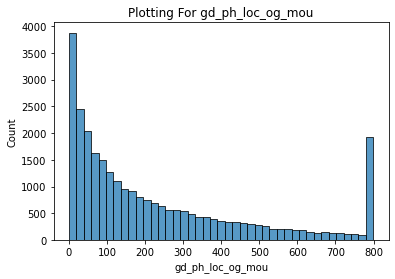

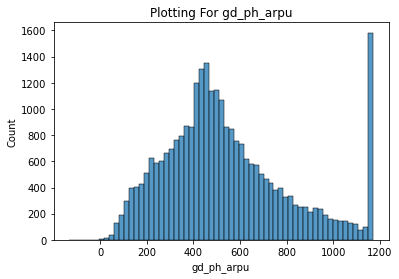

In [61]:
for i in col_analysis:
        sns.histplot(churns_data[i])
        plt.title("Plotting For " + i)
        plt.show()

##  Bivariate Analysis:

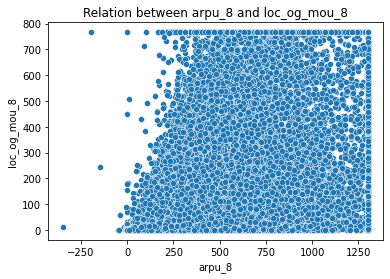

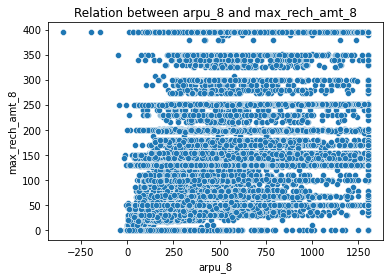

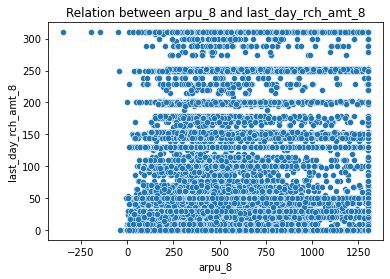

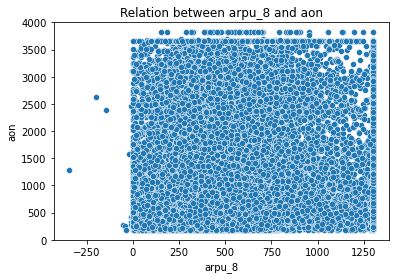

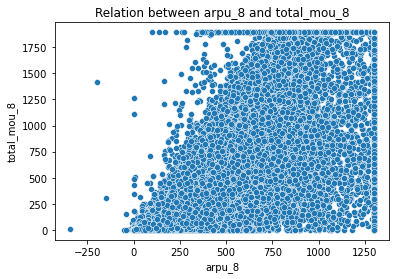

...

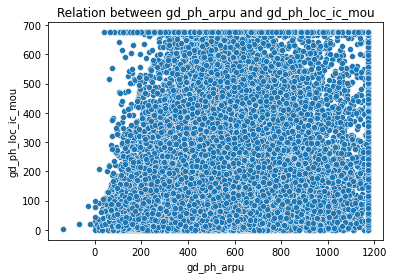

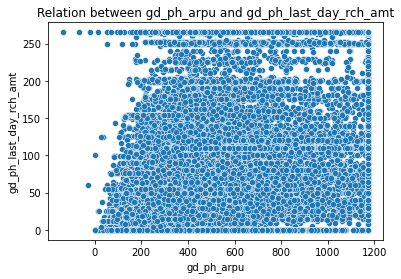

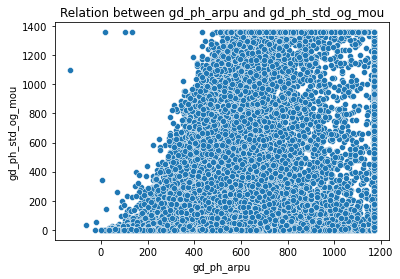

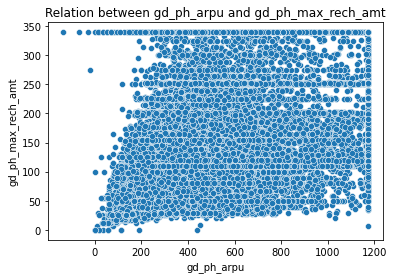

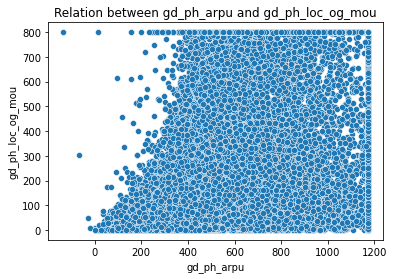

In [62]:
### Plotting Scatter plot
for i in col_analysis:
    for j in col_analysis:
        if i != j:
            sns.scatterplot(churns_data[i],  churns_data[j])
            plt.title("Relation between " + i + " and " + j)
            plt.show()

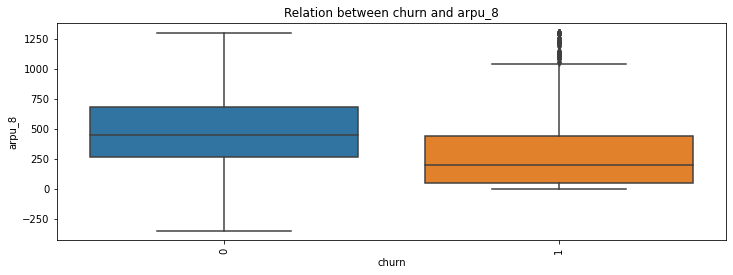

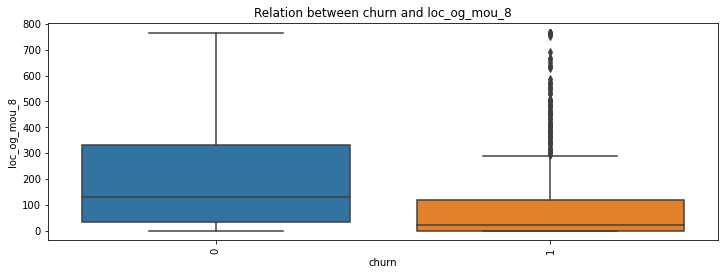

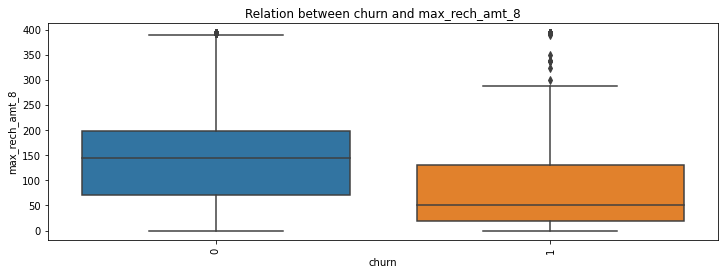

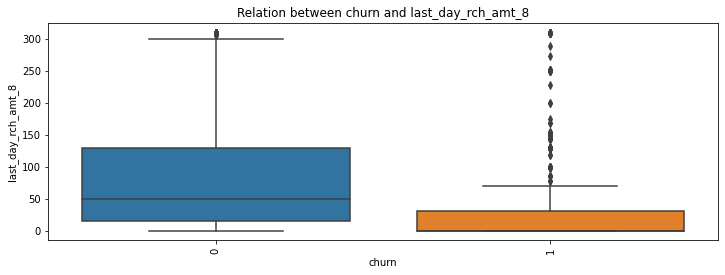

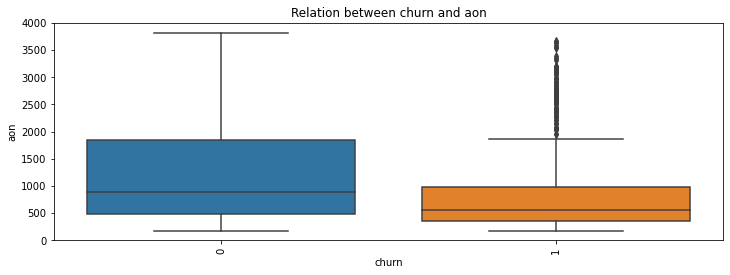

...

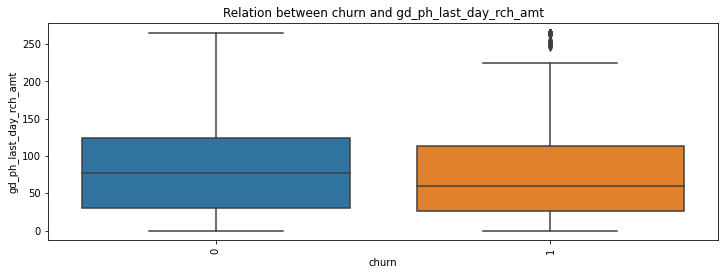

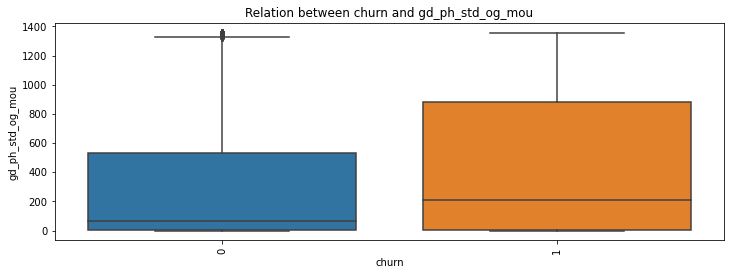

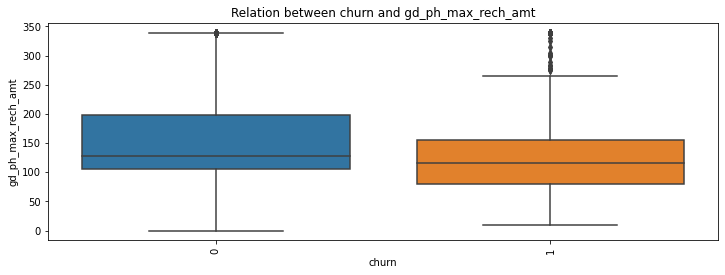

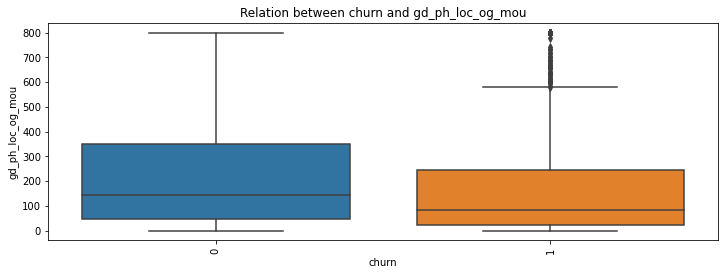

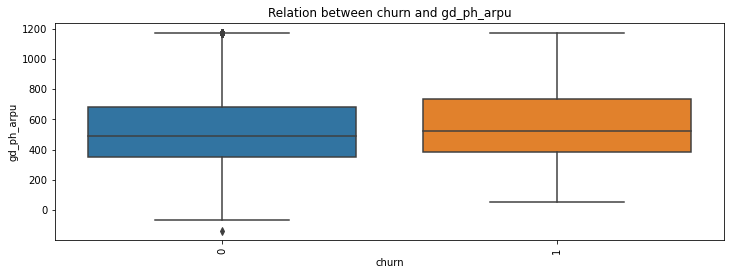

In [63]:
## Using box plot: 

cate_cols = ["churn"]
for i in cate_cols:
    for j in col_analysis:
        plt.figure(figsize = [12,4])
        sns.boxplot(churns_data[i], churns_data[j])
        plt.xticks(rotation = 90)
        plt.title("Relation between " + i + " and " + j)
        plt.show()

##  Corr-realation Heatmap:



<AxesSubplot:>

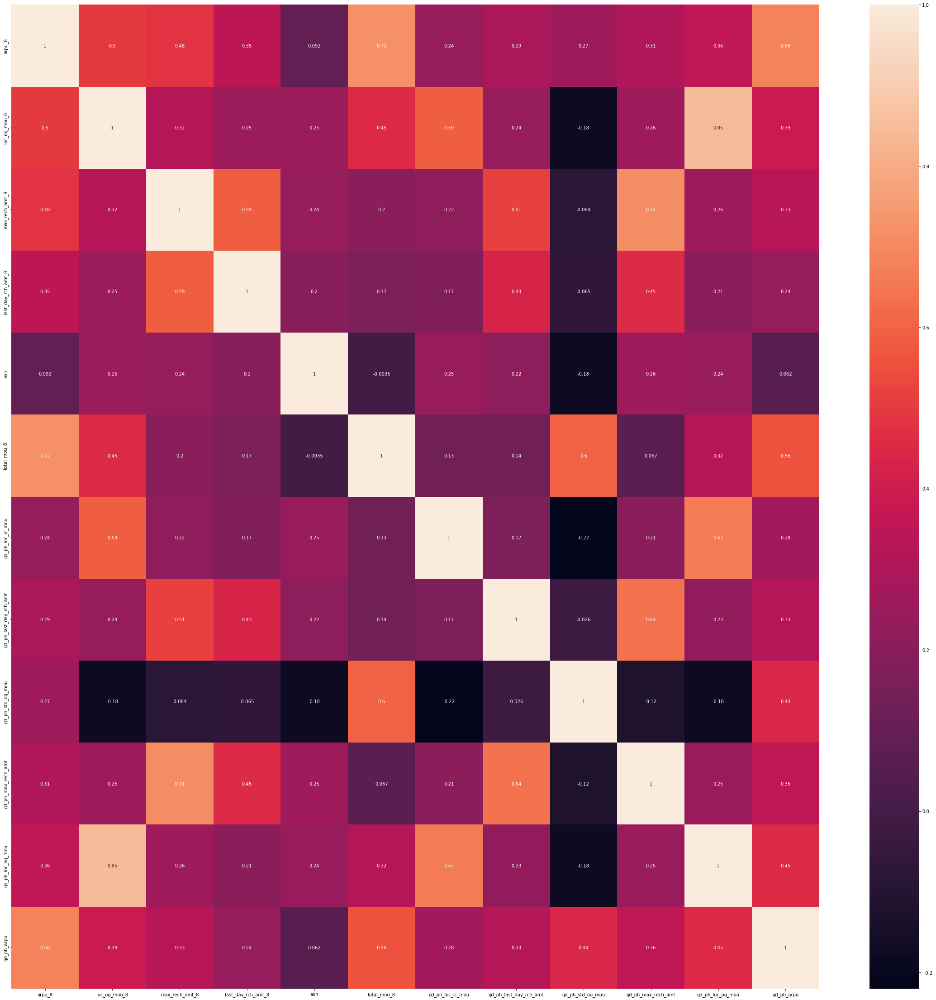

In [64]:
##  Plotting Heatmap:
plt.figure(figsize = (40, 40))
sns.heatmap(churns_data[col_analysis].corr(), annot = True)

### Multivariate Analysis: 

In [65]:
churns_data["churn"].value_counts()

0    27295
1      868
Name: churn, dtype: int64

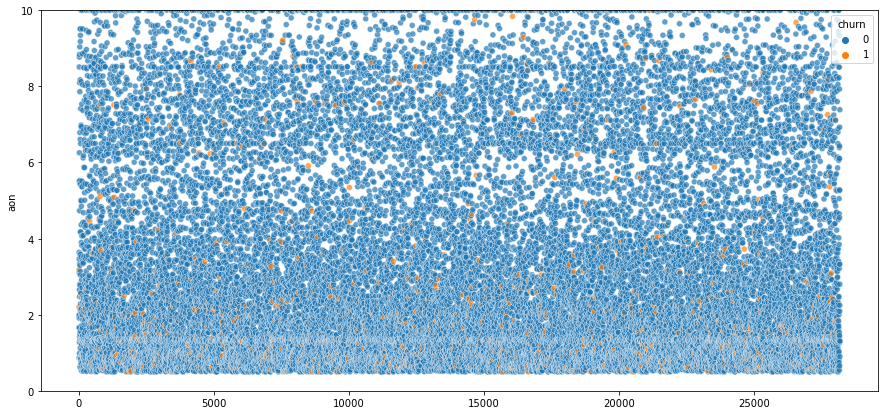

In [66]:
# Check churn based on tenure

plt.figure(figsize=(15,7))
sns.scatterplot(y=churn_data['aon'] / 365, x=churn_data.index, hue=churn_data.churn, alpha=0.7)
plt.ylim(0,10)
plt.show()

##### observation :  Though we cannot see a clear pattern here, but we can notice that the mojority of churners had a tenure of less than 4 years

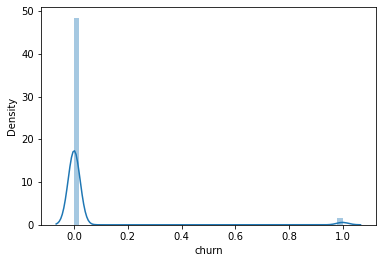

In [67]:
# Distribution of target variable

sns.distplot(churn_data['churn'])
plt.show()

#### Observation
##### Though the varible is not skwed it is higly imbalanced, the number of non-churners in the dataset is around 94%
###### We will handle this imbalance using SMOTE algorithm

##  Data Preperation;

In [68]:

##  (1)  We are spliting the data into target variable and independent variables.

y = churn_data['churn']
X = churn_data.drop('churn', axis=1)

In [69]:
##  (2)   Rescaling the features:  We will use Min_Max scaling(normalisation) Between 0 and 1

from sklearn.preprocessing import MinMaxScaler

#  Inatantiate an object:

scaler = MinMaxScaler()

# Fit on data:
X[X.columns] = scaler.fit_transform(X[X.columns])

X.head()

,arpu_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,total_mou_8,gd_ph_std_ic_mou,gd_ph_spl_og_mou,gd_ph_loc_og_t2c_mou,gd_ph_og_others,gd_ph_monthly_2g,gd_ph_spl_ic_mou,gd_ph_std_ic_t2f_mou,gd_ph_max_rech_amt,gd_ph_monthly_3g,gd_ph_total_rech_num,gd_ph_loc_og_mou,gd_ph_last_day_rch_amt,gd_ph_arpu,gd_ph_ic_others,gd_ph_vol_2g_mb,gd_ph_std_ic_t2t_mou,gd_ph_sachet_2g,gd_ph_std_og_t2f_mou,gd_ph_roam_ic_mou,gd_ph_total_mou,gd_ph_loc_ic_mou,gd_ph_sachet_3g,gd_ph_std_og_mou,gd_ph_isd_og_mou,gd_ph_isd_ic_mou,gd_ph_roam_og_mou,gd_ph_vbc_3g,vbc_3g_8
0,1.000000,0.007588,0.007131,0.000000,0.334023,0.032269,0.005568,0.001762,0.006810,0.0,0.034895,0.007052,0.015922,0.032556,0.0,0.009202,0.012514,0.030769,1.000000,1.000000,0.000000e+00,0.0,0.000000,0.0000,0.00000,0.170961,0.199942,0.031403,0.001966,0.0,0.0,0.000000,0.006321,0.036467,1.000000,0.000000,0.025890,0.598053,0.000000,1.000000,0.010891,0.000000,0.004327,0.000000,0.034916,0.008123,0.060630,0.579993,0.000000,0.050164,1.580203e-05,0.001468,0.007535,0.002327,0.004470
1,0.293123,0.000000,0.000000,0.020322,0.082321,0.000000,0.007030,0.000000,0.010718,0.0,0.002930,0.000023,0.000000,0.000126,0.0,0.000000,0.000000,0.066667,0.076046,0.032258,2.698422e-06,0.0,0.068182,0.0000,0.00000,0.037106,0.090698,0.002406,0.000000,0.0,0.0,0.111111,0.000000,0.000000,0.359882,0.000000,0.122977,0.416774,0.094340,0.436110,0.000000,0.022421,0.000052,0.013158,0.000000,0.000000,0.050298,0.077959,0.000000,0.100970,0.000000e+00,0.000000,0.000000,0.063049,0.001628
2,0.597124,0.000000,0.000000,0.000000,0.169421,0.000000,0.067152,0.000000,0.000000,0.0,0.029526,0.000042,0.000000,0.017111,0.0,0.000000,0.000000,0.133333,0.126743,0.161290,0.000000e+00,0.0,0.000000,0.0000,0.00000,0.148423,0.564898,0.011187,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.147493,0.000000,0.148867,0.119558,0.094340,0.528509,0.000000,0.000000,0.001780,0.000000,0.000000,0.000000,0.101083,0.157761,0.000000,0.626304,0.000000e+00,0.000000,0.000000,0.000000,0.000000
3,0.432612,0.000000,0.000000,0.050337,0.237847,0.000000,0.002833,0.000000,0.018554,0.0,0.041607,0.003105,0.000000,0.009617,0.0,0.001089,0.010795,0.015385,0.453739,0.000000,8.994739e-07,0.0,0.000000,0.0625,0.02439,0.116540,0.126600,0.001583,0.000044,0.0,0.0,0.000000,0.000000,0.000000,0.264012,0.086957,0.019417,0.166135,0.337736,0.205289,0.001884,0.000030,0.000045,0.000000,0.000000,0.000000,0.014682,0.215552,0.000000,0.003213,8.778907e-07,0.002498,0.000000,0.003166,0.003132
4,0.458288,0.000000,0.000000,0.001592,0.000000,0.000000,0.000000,0.000000,0.000587,0.0,0.007523,0.000012,0.000093,0.000175,0.0,0.000000,0.000165,0.000000,1.000000,1.000000,7.168807e-04,0.0,0.000000,0.0625,0.00000,0.315536,0.000000,0.000785,0.000000,0.0,0.0,0.000000,0.000000,0.000502,1.000000,0.391304,0.061489,0.000000,0.475472,1.000000,0.000662,0.009120,0.000258,0.000000,0.000000,0.000000,0.000000,0.003229,0.075472,0.000000,0.000000e+00,0.000000,0.000000,0.269914,0.027725


## Handling imbalanced class:

In [70]:
pip install imbalanced-learn


Note: you may need to restart the kernel to use updated packages.


In [71]:
import imblearn

In [72]:
# Use SMOTE to take care of class imbalance
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

In [73]:
y_res.value_counts()

1    27295
0    27295
Name: churn, dtype: int64

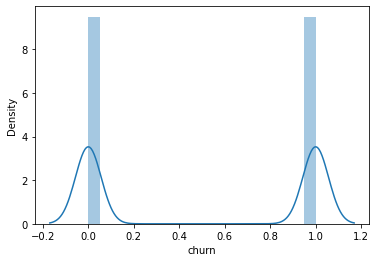

In [74]:
sns.distplot(y_res)
plt.show()

####  Now the class is balanced and the target variable is not skwed

##   Modeling: (1) PCA

In [75]:
# import numpy as np

from sklearn.decomposition import PCA

pca = PCA(random_state = 42)
X_pca = pca.fit_transform(X_res)
pca.components_

array([[ 2.64965861e-01,  2.02021191e-03,  2.80742710e-03, ...,
         5.10254403e-03,  1.54604692e-02,  1.12486555e-02],
       [ 1.86281523e-01,  1.54940919e-03,  5.25995632e-03, ...,
         9.47081387e-03, -1.73752966e-02, -8.89748651e-03],
       [ 5.85770807e-02,  5.00815989e-03,  7.42883495e-03, ...,
         1.78980314e-02,  2.79273282e-02,  1.75706710e-02],
       ...,
       [-3.57802221e-04,  1.62213540e-02,  4.24950570e-06, ...,
         3.82576211e-03,  1.80779757e-03, -2.46594088e-03],
       [ 9.89757923e-04,  2.15699827e-03, -5.96092673e-03, ...,
         1.07896517e-03,  1.59394003e-03, -1.73850809e-03],
       [-9.02022859e-04, -1.47560086e-04,  5.65030040e-03, ...,
        -5.46340652e-03, -1.70568759e-03, -9.56780151e-04]])

In [76]:
pca.explained_variance_ratio_

array([3.47970929e-01, 2.03358928e-01, 1.36366816e-01, 6.53993693e-02,
       5.46360737e-02, 4.37310487e-02, 3.15206307e-02, 2.71876701e-02,
       2.02870043e-02, 1.64429920e-02, 1.18113506e-02, 8.05954963e-03,
       5.58725237e-03, 4.45421052e-03, 2.84096259e-03, 2.25890804e-03,
       2.11320568e-03, 1.72065214e-03, 1.45989114e-03, 1.18784014e-03,
       1.13128194e-03, 1.00702251e-03, 9.86982892e-04, 8.60673635e-04,
       8.41757630e-04, 7.84676239e-04, 6.87530208e-04, 4.90556868e-04,
       4.77101089e-04, 4.15248798e-04, 4.06264973e-04, 3.76019091e-04,
       3.15797165e-04, 2.82540454e-04, 2.68297219e-04, 2.54741338e-04,
       2.31426831e-04, 2.30136001e-04, 2.12945515e-04, 1.81768057e-04,
       1.79447827e-04, 1.69115026e-04, 1.18300948e-04, 1.16029080e-04,
       9.58159727e-05, 8.61560189e-05, 7.25717037e-05, 7.17970443e-05,
       6.69394910e-05, 6.23100253e-05, 3.94254334e-05, 3.08578287e-05,
       2.97528019e-05, 1.98839787e-05, 3.54364386e-06])

<BarContainer object of 55 artists>

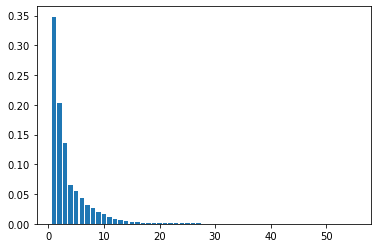

In [77]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)

In [78]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

var_cumu

array([0.34797093, 0.55132986, 0.68769667, 0.75309604, 0.80773212,
       0.85146316, 0.8829838 , 0.91017147, 0.93045847, 0.94690146,
       0.95871281, 0.96677236, 0.97235961, 0.97681382, 0.97965479,
       0.9819137 , 0.9840269 , 0.98574755, 0.98720744, 0.98839528,
       0.98952657, 0.99053359, 0.99152057, 0.99238125, 0.993223  ,
       0.99400768, 0.99469521, 0.99518577, 0.99566287, 0.99607812,
       0.99648438, 0.9968604 , 0.9971762 , 0.99745874, 0.99772704,
       0.99798178, 0.9982132 , 0.99844334, 0.99865629, 0.99883805,
       0.9990175 , 0.99918662, 0.99930492, 0.99942095, 0.99951676,
       0.99960292, 0.99967549, 0.99974729, 0.99981423, 0.99987654,
       0.99991596, 0.99994682, 0.99997657, 0.99999646, 1.        ])

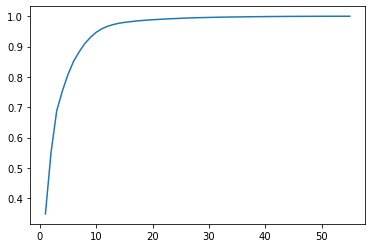

In [79]:
##  making the scree plot

plt.plot(range(1,len(var_cumu)+1), var_cumu)

### PCA with 10 components:

In [80]:
pc2 = PCA(n_components=  10, random_state=42)

In [81]:
newdata = pc2.fit_transform(X_res)

In [82]:
df = pd.DataFrame(newdata, columns=["PC1", "PC2", "PC3", "PC4", "PC5", "PC6", "PC7", "PC8", "PC9", "PC10"])
df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,1.096742,-0.046307,0.321152,-0.264274,-0.299988,0.594064,0.394986,0.566412,-0.185361,0.075988
1,-0.360438,-0.218492,-0.187920,-0.008786,-0.177469,-0.080190,-0.086537,0.209345,-0.026408,0.045465
2,-0.244190,0.502407,-0.212964,-0.301439,0.059774,-0.002945,0.003573,-0.076497,-0.066615,0.045047
3,-0.160889,-0.328724,0.033481,-0.153683,-0.119750,-0.187914,0.074102,-0.133406,0.179522,-0.165692
4,0.516925,-0.157255,1.118520,-0.051742,-0.126548,0.438301,0.087590,0.474856,-0.239395,-0.027475


In [83]:
df_final = pd.concat([df, y_res], axis=1)

df_final.head() 

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,churn
0,1.096742,-0.046307,0.321152,-0.264274,-0.299988,0.594064,0.394986,0.566412,-0.185361,0.075988,1
1,-0.360438,-0.218492,-0.187920,-0.008786,-0.177469,-0.080190,-0.086537,0.209345,-0.026408,0.045465,0
2,-0.244190,0.502407,-0.212964,-0.301439,0.059774,-0.002945,0.003573,-0.076497,-0.066615,0.045047,0
3,-0.160889,-0.328724,0.033481,-0.153683,-0.119750,-0.187914,0.074102,-0.133406,0.179522,-0.165692,0
4,0.516925,-0.157255,1.118520,-0.051742,-0.126548,0.438301,0.087590,0.474856,-0.239395,-0.027475,0


#### we are unable to get any observations:

##  (2)  Logistic regression

In [84]:
X_res.shape

(54590, 55)

In [85]:
y_res.shape

(54590,)

### Splitting into train and test data set:

In [86]:
from sklearn.model_selection import train_test_split

In [87]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, train_size = 0.7, random_state = 100 )

In [88]:
print("X Train Shape", X_train.shape)
print("X Test Shape", X_test.shape)
print("y Train Shape", y_train.shape)
print("y Test Shape", y_test.shape)

X Train Shape (38213, 55)
X Test Shape (16377, 55)
y Train Shape (38213,)
y Test Shape (16377,)


### Feature Selection:

In [89]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [90]:
## Create a LR object:
estimator = LogisticRegression(solver='liblinear')

## Features:
selector = RFE(estimator,  n_features_to_select=15)

## fitting the data

selector.fit(X_train, y_train)

selector.support_

array([False,  True, False, False, False,  True, False, False, False,
       False,  True,  True, False,  True,  True, False, False,  True,
       False, False,  True,  True,  True,  True,  True, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False])

In [91]:
X_train.columns[selector.support_]

Index(['roam_ic_mou_8', 'std_og_t2f_mou_8', 'loc_ic_mou_8', 'std_ic_t2t_mou_8',
       'std_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8', 'vol_2g_mb_8',
       'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'sachet_3g_8',
       'gd_ph_total_rech_num', 'gd_ph_vol_2g_mb', 'gd_ph_isd_ic_mou'],
      dtype='object')

In [92]:
cols_to_keep  =  X_train.columns[selector.support_]

In [93]:
X_train = X_train[cols_to_keep]

X_test  = X_test[cols_to_keep]

In [94]:
X_train.head()

,roam_ic_mou_8,std_og_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_mou_8,spl_ic_mou_8,total_rech_num_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,gd_ph_total_rech_num,gd_ph_vol_2g_mb,gd_ph_isd_ic_mou
17456,0.078992,0.000000,0.109610,0.000000,0.002394,0.000000,0.035897,0.000000,0.0,0.000000,0.0,0.0,0.074434,0.000000,0.001505
29347,0.000000,0.000000,0.009821,0.003673,0.004770,0.000000,0.012268,0.000000,0.0,0.000000,0.0,0.0,0.124247,0.011506,0.000000
7973,0.000000,0.216595,0.019125,0.000000,0.012843,0.000000,0.035897,0.000306,0.0,0.022727,0.0,0.0,0.048544,0.000000,0.003017
24967,0.013276,0.000000,0.076962,0.000000,0.000401,0.040128,0.076923,0.000000,0.0,0.090909,0.0,0.0,0.074434,0.000000,0.000000
3688,0.000000,0.000000,0.022506,0.000000,0.000342,0.000000,0.046154,0.000000,0.0,0.000000,0.0,0.0,0.061489,0.000000,0.000000


<AxesSubplot:>

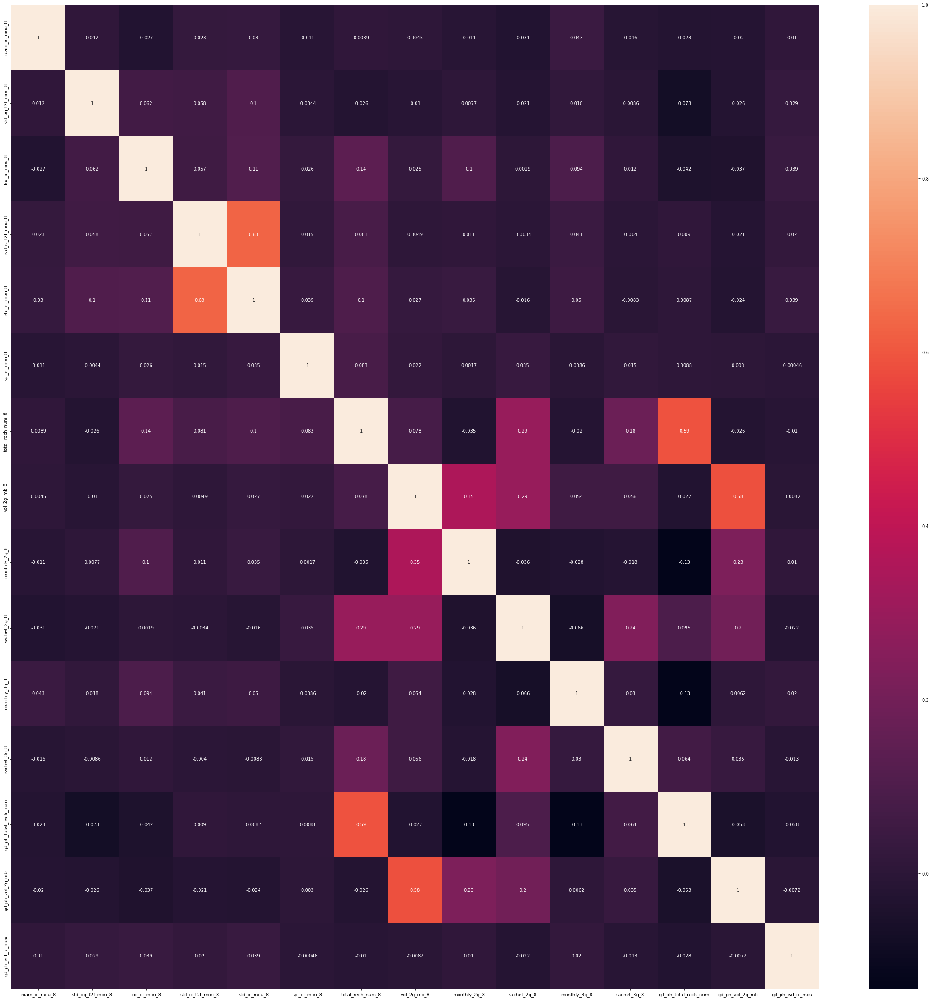

In [95]:
## Heatmap:  (significance variable)

plt.figure(figsize = [40, 40])
sns.heatmap(X_train.corr(), annot= True)

In [96]:
## Interpretation:  we can see the std_ic_mou_8 is highly related with std_ic_t2t_mou_8.

### Modeling:

In [97]:
import statsmodels.api as sm

X_train_sm  =   sm.add_constant(X_train)
X_test_sm  =    sm.add_constant(X_test)

model_one = sm.GLM(y_train, X_train_sm,  family = sm.families.Binomial())

result_one = model_one.fit()

result_one.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38213
Model:                            GLM   Df Residuals:                    38197
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -19735.
Date:                Tue, 14 Feb 2023   Deviance:                       39470.
Time:                        21:26:30   Pearson chi2:                 1.36e+07
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7065      0.027     26.259      0.000       0.654       0.759
roam_ic_mou_8           -6.5217      1.022     -6.379      0.000      -8.525      -4.518
std_og_t2f_mou_8        -6.4177      1.095     -5.860      0.000      -8.564      -4.271
loc_ic_mou_8           -18.4563      0.447    -41.301      0.000     -19.332     -17.580
std_ic_t2t_mou_8       -16.5347      2.579     -6.412      0.000     -21.589     -11.481
std_ic_mou_8            -3.2023      1.142     -2.805      0.005      -5.440      -0.965
spl_ic_mou_8           -12.0871      1.088    -11.109      0.000     -14.220      -9.955
total_rech_num_8       -22.7858      0.536    -42.542      0.000     -23.836     -21.736
vol_2g_mb_8            -10.6815      1.056    -10.115      0.000     -12.751      -8.612
monthly_2g_8            -8.0955      0.288    -28.111      0.000      -8.660      -7.531
sachet_2g_8             -6.7156      0.384    -17.505      0.000      -7.467      -5.964
monthly_3g_8           -14.0007      0.595    -23.538      0.000     -15.166     -12.835
sachet_3g_8             -7.0900      0.968     -7.322      0.000      -8.988      -5.192
gd_ph_total_rech_num    14.1457      0.366     38.602      0.000      13.427      14.864
gd_ph_vol_2g_mb          6.1569      0.516     11.923      0.000       5.145       7.169
gd_ph_isd_ic_mou        14.1515      1.383     10.233      0.000      11.441      16.862
========================================================================================
"""

#### Note: drop the columns which have above p = 0.05 value (one by one) from X_train_sm and X_test_sm but here all the p-value< 0.05

## Checking VIF values:

In [98]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [99]:
# Creating a DataFrame that will contain the names of all the feature variables and their respective VIF:

vif = pd.DataFrame()
vif['Features']  =  X_train_sm.columns
vif['VIF']  =  [variance_inflation_factor(X_train_sm.values , i )  for i in range(X_train_sm.shape[1])]
vif['VIF']  = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF",  ascending = False)
vif


,Features,VIF
0,const,4.08
7,total_rech_num_8,1.84
8,vol_2g_mb_8,1.79
5,std_ic_mou_8,1.70
13,gd_ph_total_rech_num,1.67
4,std_ic_t2t_mou_8,1.66
14,gd_ph_vol_2g_mb,1.55
10,sachet_2g_8,1.30
9,monthly_2g_8,1.21
3,loc_ic_mou_8,1.08


### Note: Note: All the VIF values should be less than<5. If any column which have above 5 value. we have to drop that column and create New model. we can have large vif value for constant term.

In [100]:
## Final Model: 
model_final = sm.GLM(y_train, X_train_sm,  family = sm.families.Binomial())

result_final = model_final.fit()

result_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38213
Model:                            GLM   Df Residuals:                    38197
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -19735.
Date:                Tue, 14 Feb 2023   Deviance:                       39470.
Time:                        21:26:31   Pearson chi2:                 1.36e+07
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7065      0.027     26.259      0.000       0.654       0.759
roam_ic_mou_8           -6.5217      1.022     -6.379      0.000      -8.525      -4.518
std_og_t2f_mou_8        -6.4177      1.095     -5.860      0.000      -8.564      -4.271
loc_ic_mou_8           -18.4563      0.447    -41.301      0.000     -19.332     -17.580
std_ic_t2t_mou_8       -16.5347      2.579     -6.412      0.000     -21.589     -11.481
std_ic_mou_8            -3.2023      1.142     -2.805      0.005      -5.440      -0.965
spl_ic_mou_8           -12.0871      1.088    -11.109      0.000     -14.220      -9.955
total_rech_num_8       -22.7858      0.536    -42.542      0.000     -23.836     -21.736
vol_2g_mb_8            -10.6815      1.056    -10.115      0.000     -12.751      -8.612
monthly_2g_8            -8.0955      0.288    -28.111      0.000      -8.660      -7.531
sachet_2g_8             -6.7156      0.384    -17.505      0.000      -7.467      -5.964
monthly_3g_8           -14.0007      0.595    -23.538      0.000     -15.166     -12.835
sachet_3g_8             -7.0900      0.968     -7.322      0.000      -8.988      -5.192
gd_ph_total_rech_num    14.1457      0.366     38.602      0.000      13.427      14.864
gd_ph_vol_2g_mb          6.1569      0.516     11.923      0.000       5.145       7.169
gd_ph_isd_ic_mou        14.1515      1.383     10.233      0.000      11.441      16.862
========================================================================================
"""

In [101]:
# Predict on train data

y_train_pred = result_final.predict(X_train_sm).values.reshape(-1)
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.170370,0
1,1,0.880603,1
2,0,0.210477,0
3,0,0.069323,0
4,0,0.527028,1


In [102]:
train_pred =  result_final.predict(X_train_sm)

train = pd.DataFrame(train_pred,   columns = ["churn_probs"])

train["churn"]  = y_train


train["predicted"]  =  np.where(train["churn_probs"]>0.5,  1, 0)  ## by default 0.5

train.head()

,churn_probs,churn,predicted
17456,0.170370,0,0
29347,0.880603,1,1
7973,0.210477,0,0
24967,0.069323,0,0
3688,0.527028,0,1


## Evaluation: 

In [103]:
from sklearn import metrics

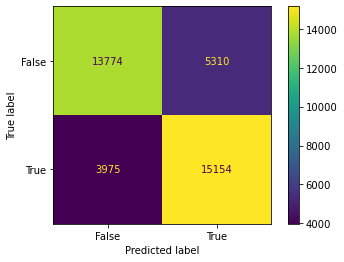

In [104]:
##  Confusion Matrix:

Confusion_matrix  =  metrics.confusion_matrix(train["churn"],  train["predicted"])

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix =  Confusion_matrix,  display_labels = ["False", "True"] )

cm_display.plot()

plt.show()

In [105]:
##  Finding Accuracy:
print("Train Accuracy:" , round(metrics.accuracy_score(train["churn"], train["predicted"])*100,  2))

Train Accuracy: 75.7


In [106]:
##  Finding Recall:
print("Train Recall:" , round(metrics.recall_score(train["churn"], train["predicted"])*100,  2))

Train Recall: 79.22


In [107]:
##  Finding Precision_score:
print("Train Precision:" , round(metrics.precision_score(train["churn"], train["predicted"])*100,  2))

Train Precision: 74.05


###  Roc Curve:

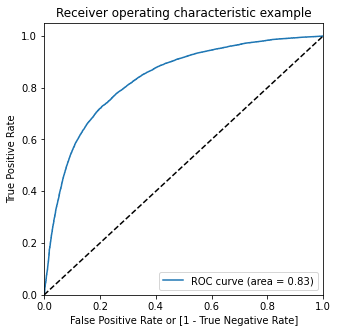

In [108]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False)
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

fpr, tpr, thresholds = metrics.roc_curve( train.churn, train.churn_probs, drop_intermediate = False )
draw_roc(train.churn, train.churn_probs)

In [109]:
##  For Testing data: 


test_pred =  result_final.predict(X_test_sm)

test = pd.DataFrame(test_pred,   columns = ["churn_probs"])

test["churn"]  = y_test

test["predicted"]  =  np.where(test["churn_probs"]>0.5,  1, 0)  ## by default 0.5



test.head()

,churn_probs,churn,predicted
17581,0.792078,0,1
22642,0.207823,0,0
19660,0.238661,0,0
48412,0.775090,1,1
40666,0.677907,1,1


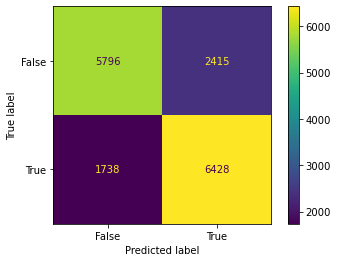

In [110]:
Confusion_matrix  =  metrics.confusion_matrix(test["churn"],  test["predicted"])

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix =  Confusion_matrix,  display_labels = ["False", "True"] )

cm_display.plot()

plt.show()

In [111]:
##  Finding Accuracy:
print("Test Accuracy:" , round(metrics.accuracy_score(test["churn"], test["predicted"])*100,  2))


##  Finding Recall:
print("Test Recall:" , round(metrics.recall_score(test["churn"], test["predicted"])*100,  2))


##  Finding Precision_score:
print("Test Precision:" , round(metrics.precision_score(test["churn"], test["predicted"])*100,  2))

Test Accuracy: 74.64
Test Recall: 78.72
Test Precision: 72.69


In [112]:
##   Observation:  Overall the model is good.

In [113]:
# Top 10 predictors

abs(result_final.params).sort_values(ascending=False)[0:11]

total_rech_num_8        22.785784
loc_ic_mou_8            18.456252
std_ic_t2t_mou_8        16.534703
gd_ph_isd_ic_mou        14.151481
gd_ph_total_rech_num    14.145653
monthly_3g_8            14.000665
spl_ic_mou_8            12.087146
vol_2g_mb_8             10.681501
monthly_2g_8             8.095542
sachet_3g_8              7.089962
sachet_2g_8              6.715562
dtype: float64

#### So using Logistic regression we are geting an accuracy of 75.7% on train data and 74.6% on test data
#### We can clearly see most of the critical features are form the action phase, which is inline with the bussiness understanding that action phase needs more attention

### (2)  Decision tree Model: 

In [114]:
## Splitting the data into train and test:

X_train, X_test, y_train, y_test = train_test_split(X_pca, y_res, train_size=0.7, random_state=25)

In [115]:
from sklearn.tree import DecisionTreeClassifier

# Initial classifier
Frist_model = DecisionTreeClassifier(random_state=42, max_depth=10)
Frist_model.fit(X_train, y_train)

# Train Accuracy
y_train_pred = Frist_model.predict(X_train)
print(f'Train accuracy : {metrics.accuracy_score(y_train, y_train_pred)}')

y_test_pred = Frist_model.predict(X_test)

# Print the report on test data
print(metrics.classification_report(y_test, y_test_pred))

Train accuracy : 0.8794127652892995
              precision    recall  f1-score   support

           0       0.87      0.81      0.84      8215
           1       0.82      0.87      0.85      8162

    accuracy                           0.84     16377
   macro avg       0.84      0.84      0.84     16377
weighted avg       0.84      0.84      0.84     16377



### Hyperparameter Tunning:

In [116]:
from sklearn.model_selection import GridSearchCV

dt = DecisionTreeClassifier(random_state=42)

# Define parameters
params = {
    "max_depth": [2, 3, 5, 10, 20, 30, 40, 50, 100],
    "min_samples_leaf": [5, 10, 20, 50, 100, 250, 500, 800, 1000],
    "min_samples_leaf" : [1, 5, 10, 25, 50, 100]
}

grid_search = GridSearchCV(estimator=dt,
                           param_grid=params,
                           cv=4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

# Perform gridsearch
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 54 candidates, totalling 216 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20, 30, 40, 50, 100],
                         'min_samples_leaf': [1, 5, 10, 25, 50, 100]},
             scoring='accuracy', verbose=1)

In [117]:
grid_search.best_score_

0.8971555372546595

In [118]:
# Best estimator
dt_best = grid_search.best_estimator_
dt_best

DecisionTreeClassifier(max_depth=30, random_state=42)

In [119]:
y_train_pred = dt_best.predict(X_train)
y_test_pred = dt_best.predict(X_test)

# Print the report
print(metrics.classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.94      0.88      0.91      8215
           1       0.88      0.94      0.91      8162

    accuracy                           0.91     16377
   macro avg       0.91      0.91      0.91     16377
weighted avg       0.91      0.91      0.91     16377



In [120]:
##  Observation:  We are getting an accuracy of 87% on test data, with decission tree

### (3)  Random Forest:  

In [121]:
from sklearn.ensemble import RandomForestClassifier

In [122]:
random_F = RandomForestClassifier(n_estimators=15, max_depth=10, max_features=5, random_state=25, oob_score=True)
random_F.fit(X_train, y_train)

y_train_pred = random_F.predict(X_train)

# Train Accuracy
y_train_pred = Frist_model.predict(X_train)
print(f'Train accuracy : {metrics.accuracy_score(y_train, y_train_pred)}')

y_test_pred = random_F.predict(X_test)

# Print the report
print(metrics.classification_report(y_test, y_test_pred))

Train accuracy : 0.8794127652892995
              precision    recall  f1-score   support

           0       0.92      0.87      0.90      8215
           1       0.88      0.92      0.90      8162

    accuracy                           0.90     16377
   macro avg       0.90      0.90      0.90     16377
weighted avg       0.90      0.90      0.90     16377



### Hypermarameter tunning:

In [123]:
rf = RandomForestClassifier(random_state=25, n_jobs=-1)

# Define parameters
params = {
    'max_depth': [2, 5, 10, 20],
    'min_samples_leaf': [5, 10],
    'n_estimators': [10, 15] }

grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 16 candidates, totalling 64 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=25),
             n_jobs=-1,
             param_grid={'max_depth': [2, 5, 10, 20],
                         'min_samples_leaf': [5, 10],
                         'n_estimators': [10, 15]},
             scoring='accuracy', verbose=1)

In [124]:
grid_search.best_score_

0.9438410175366405

In [125]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_estimators=15,
                       n_jobs=-1, random_state=25)

In [126]:
y_train_pred = rf_best.predict(X_train)
y_test_pred = rf_best.predict(X_test)

# Print the report
print(metrics.classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.93      0.95      8215
           1       0.94      0.97      0.95      8162

    accuracy                           0.95     16377
   macro avg       0.95      0.95      0.95     16377
weighted avg       0.95      0.95      0.95     16377



####  Observation:   We are getting an accuracy of 95% on test data, with Random forest

### (4) Adaboost: 

In [127]:
from sklearn.ensemble import AdaBoostClassifier

In [128]:
# Create a shallow tree as weak learner
shallow_tree = DecisionTreeClassifier(max_depth=2, random_state = 100)

# Fit the shallow decision tree 
shallow_tree.fit(X_train, y_train)

# Test error
y_pred = shallow_tree.predict(X_test)
score = metrics.accuracy_score(y_test, y_pred)
score

0.7061122305672589

In [135]:
adaboost_best = AdaBoostClassifier(base_estimator=shallow_tree, n_estimators = 20, random_state=25)
adaboost_best.fit(X_train, y_train)
y_pred = adaboost_best.predict(X_test)

print(metrics.classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.93      0.95      8215
           1       0.94      0.97      0.95      8162

    accuracy                           0.95     16377
   macro avg       0.95      0.95      0.95     16377
weighted avg       0.95      0.95      0.95     16377



Note:  (1)  Given our bussines probelm, to retain their customers, we need higher recall. As giving an offer to an user not                 going to churn will cost less as compared to loosing a customer and bring new customer, we need to have high rate of             correctly identifying the true positives, hence recall.
      
       (2)   RandomForest model is best because has good accuracy around  95% and good recall value.

### Conclusion: 

(1)   Some feature like total_rech_num_8, loc_ic_mou_8, std_ic_t2t_mou_8,  gd_ph_isd_ic_mou, gd_ph_total_rech_num, in customer churning
      prediction is very crucial. 
       
        
(2)   every user have average revenue less than around 400 of sep can be churn. (through EDA)


(3)   users who have only last month average recharge of sep around 60 , can be churn.


## Thanks